In [1]:
import xarray as xr
#import rioxarray as rxr
import xesmf as xe
import pandas as pd
import numpy as np
import calendar as cld
import matplotlib.pyplot as plt
import matplotlib.colors
colors_land = plt.cm.terrain(np.linspace(0.25, 1, 256))
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy.stats import chi2
from numba import njit,prange
import matplotlib as mpl
mpl.rcParams['hatch.linewidth'] = 0.05  # previous pdf hatch linewidth
from matplotlib.dates import DateFormatter

from pyproj import CRS,Transformer,Proj

import sys
sys.path.insert(1, '/home/castelli/Notebooks/PhD/utils') # to include my util file in previous directory
import utils as u
u.check_python_version()

3.10.13 | packaged by conda-forge | (main, Oct 26 2023, 18:07:37) [GCC 12.3.0]


In [2]:
ds = xr.open_dataset('/bettik/beaumetj/MARout/MAR-EC-Earth3/MARgrid_EUe.nc')

imin = 32 ; imax = -30
jmin = 20 ; jmax = -15
lon = np.array(ds.LON[jmin:jmax,imin:imax])
lat = np.array(ds.LAT[jmin:jmax,imin:imax])
H = np.array(ds.SH[jmin:jmax,imin:imax])
nlat,nlon = 91, 139

normal_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
                 'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}
big_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':True,
              'lonlines':2, 'latlines':2, 'abc':False, 'latlim':[41.,50],'lonlim':[0.,20.]}
multiplot_format = {'gridlinewidth':0.1, 'gridcolor':'gray8', 'gridalpha':0.5, 'coast':True,'borders':True ,'reso':'hi', 'labels':False, 'lonlines':2,
                    'latlines':2, 'abc':False, 'latlim':[43.,48.5],'lonlim':[4.,16.]}

months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

veg_mar = ['No Veg.', # 0
           'Crops Low', # 1
           'Crops Medium', # 2
           'Crops High', # 3
           'Grass low', # 4
           'Grass Medium', # 5
           'Grass High', # 6
           'Broadleaf Low', # 7
           'Broadleaf Medium', # 8
           'Broadleaf High', # 9
           'Needle Low', # 10
           'Needle Medium', # 11
           'Needle High', # 12
           'City'] # 13

In [3]:
ds_small = xr.open_dataset('/bettik/castelli/MARout/EUh/h01/2015/ICE.h01.2015.01.01-31.nc')[["LON","LAT","SH","FRV","VEG"]]
#ds_smallish = xr.open_dataset('/bettik/castelli/MARout/EUm/m01/2014/ICE.m01.2014.09.01-30.nc')[["LON","LAT","SH","FRV","VEG"]]
ds_smallish = xr.open_dataset('/bettik/castelli/data/MAR-MPI-ESM/v3.14/MARgrid_EUm.nc')
ds_big = xr.open_dataset('/bettik/castelli/MARout/EUn/n01/2014/ICE.n01.2014.09.01-30.nc')[["LON","LAT","SH","FRV","VEG"]]

In [4]:
def detect_alps(H):
    nlat,nlon = np.shape(H)
    mask = np.bool_(np.zeros((nlat,nlon)))
    r = 4
    for j in range(r,nlat-r):
        for i in range(r,nlon-r):
            mask[j,i] = np.logical_and(H[j,i]>360 ,np.any(H[j-r:j+r,i-r:i+r]>1300))
            # mask[j,i] = np.std(H[j-r:j+r,i-r:i+r])>200
    return mask
alps = detect_alps(H)
alps[lon<4.8] = False
alps[np.logical_and(lon>10,lat<45.2)] = False

alps_month = np.repeat(alps[np.newaxis,:,:],12,axis=0)

lon_smallish = np.array(ds_smallish.LON)
lat_smallish = np.array(ds_smallish.LAT)
H_smallish = np.array(ds_smallish.SH)
alps_smallish = detect_alps(H_smallish)
alps_smallish[lon_smallish<4.8] = False
alps_smallish[np.logical_and(lon_smallish>10,lat_smallish<45.2)] = False

In [5]:
def open_monthly_data_ave(vars,year,month,days_in_month,sim,timestep_in_hours = 2,imin = 32,imax = -30,jmin = 20,jmax = -15,whichpath='castelli',
                         ds_sect = ds_small,combine=False):
    # average of mosaics
    # example of vars : ["GF","SWU","SWD","HAcc","LWU","LWD","SHF","LHF","HA_col","MBm","MBr","MBmTop","MBrTop","MB","MBrr","SAbs_v","SAbs","CC","CU","CM","CD",
    #                    "QQz","TTz","ST","SWt"]
    if whichpath=='castelli':
        path = '/bettik/castelli/MARout/EU'
    else:
        path = '/bettik/menegozm/MARout/EU'
    letter = sim[0]
    code = sim[1:]
    path = path+letter+'/'+letter+code+'/'+year+'/ICE.'+letter+code+'.'+year+'.'

    #ds_day = xr.open_dataset(path+letter+'/'+letter+code+'/'+year+'/ICE.'+letter+code+'.'+year+'.'+month+'.01-'+days_in_month+'.nc')[vars].isel(x=slice(imin,imax),
    #                                                                                                                                                y=slice(jmin,jmax))
    if combine:
        files = []
        for i in range(len(month)):
            files.append(path+month[i]+'.01-'+days_in_month[i]+'.nc')
        ds_day = xr.open_mfdataset(files,concat_dim='time', data_vars='minimal',combine='nested',coords='minimal',compat='override')[vars].isel(x=slice(imin,imax),
                                                                                                                                                y=slice(jmin,jmax))
    else:
        ds_day = xr.open_dataset(path+month+'.01-'+days_in_month+'.nc')[vars].isel(x=slice(imin,imax),y=slice(jmin,jmax))
        
    # Melt
    Lf = 3.34*10**5 # J.kg**(-1) the latent heat of fusion of water
    t_timestep = 60*60*timestep_in_hours # 60*60*24 seconds in a day
    if('MBm' in vars):
        melt_MBm = ds_day.MBm.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBm.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_day.MBm.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100 # in mm = L.m**(-2) = kg.m**(-2) because for liquid water 1L=1kg
        ds_day_melt = melt_MBm * Lf / t_timestep # kg.m**(-2) * J.kg**(-1) / s = J/s.m**(-2) = W.m**(-2)
        ds_day['melt'] = -ds_day_melt # minus sign because energy is LOST by surface in order to melt snow
    if('MBr' in vars):
        freez_MBr = ds_day.MBr.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBr.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
               ds_day.MBr.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_freez = freez_MBr * Lf / t_timestep
        ds_day['freeze'] = ds_day_freez
    if('MBmTop' in vars):
        melt_MBm_top = ds_day.MBmTop.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBmTop.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_day.MBmTop.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_melt_top = melt_MBm_top * Lf / t_timestep
        ds_day['melt_top'] = -ds_day_melt_top
    if('MBrTop' in vars):
        freez_MBr_top = ds_day.MBrTop.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBrTop.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_day.MBrTop.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_freez_top = freez_MBr_top * Lf / t_timestep
        ds_day['freeze_top'] = ds_day_freez_top
    if('MB' in vars):
        average_snow = ds_day.MB.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MB.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
               ds_day.MB.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day['MBave'] = average_snow
    if('SWD' in vars and 'SWU' in vars):
        ds_day['NSW'] = ds_day.SWD - ds_day.SWU
    if('LWD' in vars and 'LWU' in vars):
        ds_day['NLW'] = ds_day.LWD - ds_day.LWU
    if('TTz' in vars):
        ds_day['TT2'] = ds_day.TTz.sel(ztqlev=2.0)
    if('SWt' in vars):
        ds_day['SWt'] = -ds_day['SWt'] # - sign because the energy transmitted to lower layers is LOST by the surface
    if('MBrr' in vars and 'MBsf' in vars):
        ds_day['precip'] = ds_day.MBrr + ds_day.MBsf
    if('SWD' in vars and 'SWU' in vars and 'LWD' in vars and 'LWU' in vars and 'SHF' in vars and 'LHF' in vars and 'MBmTop' in vars and 'MBrTop' in vars and 'GF' in vars
       and 'HAcc' in vars and 'SWt' in vars):
        ds_day_surf_balance = ds_day.NSW + ds_day.NLW + ds_day.SHF + ds_day.LHF + ds_day.melt_top + ds_day.freeze_top + ds_day.GF + ds_day.HAcc + ds_day.SWt
        ds_day['Surf_Bal'] = ds_day_surf_balance

    return ds_day

In [6]:
def plot_comparison(list_ds,months,min,max,colormap,label_var,suptitle_var,ds_size=ds_small,N=11,cols=5,rows=2):

    f, axs = pplt.subplots(proj='cyl',axwidth=2,ncols=cols,nrows=rows,axheight=1.)

    for mon in range(cols*rows):    
        ax=axs[mon]
        m = ax.pcolormesh(ds_size.LON,ds_size.LAT,list_ds[mon],levels=np.linspace(min,max,N),cmap=colormap)
        ax.format(title=months[mon])

    f.colorbar(m,label= label_var,labelsize='large',ticklabelsize='large')
    axs.format(**multiplot_format,suptitle=suptitle_var)

In [7]:
def open_nc_monthly(scenario,first_year,last_year,ds_sect):
    inipath = '/bettik/castelli/data/MAR-MPI-ESM/v3.14/'+scenario+'/ICE.MPI_ESM_'+scenario+'.EUm.' # initial path

    for year in range(first_year,last_year):
        ds_monthly = xr.open_dataset(inipath+list_var[0]+'.'+str(year)+'.nc').resample(time='M').mean()

        for var in list_vars[1:]:
            ds_monthly[var] = xr.open_dataset(inipath+var+'.'+str(year)+'.nc').resample(time='M').mean()

    # Melt
    Lf = 3.34*10**5 # J.kg**(-1) the latent heat of fusion of water
    t_timestep = 60*60*24*complete # 60*60*24 seconds in a day
    if('MBm' in vars):
        melt_MBm = ds_monthly.MBm.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_monthly.MBm.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_monthly.MBm.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100 # in mm = L.m**(-2) = kg.m**(-2) because for liquid water 1L=1kg
        ds_monthly_melt = melt_MBm * Lf / t_timestep # kg.m**(-2) * J.kg**(-1) / s = J/s.m**(-2) = W.m**(-2)
        ds_monthly['melt'] = -ds_monthly_melt # minus sign because energy is LOST by surface in order to melt snow
    if('MBr' in vars):
        freez_MBr = ds_day.MBr.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBr.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
               ds_day.MBr.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_freez = freez_MBr * Lf / t_timestep
        ds_day['freeze'] = ds_day_freez
    if('MBmTop' in vars):
        melt_MBm_top = ds_day.MBmTop.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBmTop.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_day.MBmTop.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_melt_top = melt_MBm_top * Lf / t_timestep
        ds_day['melt_top'] = -ds_day_melt_top
    if('MBrTop' in vars):
        freez_MBr_top = ds_day.MBrTop.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MBrTop.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
                   ds_day.MBrTop.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day_freez_top = freez_MBr_top * Lf / t_timestep
        ds_day['freeze_top'] = ds_day_freez_top
    if('MB' in vars):
        average_snow = ds_day.MB.sel(sector=1.0)*ds_sect.FRV.sel(sector=1.0)/100 + ds_day.MB.sel(sector=2.0)*ds_sect.FRV.sel(sector=2.0)/100 + \
               ds_day.MB.sel(sector=3.0)*ds_sect.FRV.sel(sector=3.0)/100
        ds_day['MBave'] = average_snow
    if('SWD' in vars and 'SWU' in vars):
        ds_day['NSW'] = ds_day.SWD - ds_day.SWU
    if('LWD' in vars and 'LWU' in vars):
        ds_day['NLW'] = ds_day.LWD - ds_day.LWU
    if('TTz' in vars):
        ds_day['TT2'] = ds_day.TTz.sel(ztqlev=2.0)
    if('SWt' in vars):
        ds_day['SWt'] = -ds_day['SWt'] # - sign because the energy transmitted to lower layers is LOST by the surface
    if('MBrr' in vars and 'MBsf' in vars):
        ds_day['precip'] = ds_day.MBrr + ds_day.MBsf
    if('SWD' in vars and 'SWU' in vars and 'LWD' in vars and 'LWU' in vars and 'SHF' in vars and 'LHF' in vars and 'MBmTop' in vars and 'MBrTop' in vars and 'GF' in vars
       and 'HAcc' in vars and 'SWt' in vars):
        ds_day_surf_balance = ds_day.NSW + ds_day.NLW + ds_day.SHF + ds_day.LHF + ds_day.melt_top + ds_day.freeze_top + ds_day.GF + ds_day.HAcc + ds_day.SWt
        ds_day['Surf_Bal'] = ds_day_surf_balance

In [8]:
def plot_E_balance_and_T(slopes_var=None,trend=True,year=None,first_year=None,last_year=None,showlegend=True,snowlines=False):
    pplt.rc.update(small=14, large=12)

    n_levels=len(levels)
    n_seas=4
    seasons=['DJF','MAM','JJA','SON']
    colors = ['b','g','r','c','y','m','purple','lightblue','orange','k']
    leg_labels_null = ['','','','','','','','','','']
    leg_labels_full = ['Tmean','Tmin','Tmax','STmean','NSW','NLW','LHF','SHF','Melt','NSW+NLW+LHF+SHF+Melt']
    leg_labels = [leg_labels_full,leg_labels_null,leg_labels_null,leg_labels_null]


    with pplt.rc.context({'suptitle.weight': 'normal', 'suptitle.size': 14}):
        f, axs = pplt.subplots(ncols=4,axwidth=3)
    axs2 = axs.twiny()
    
    mean_slope_T=np.full((n_seas,n_levels),np.nan)
    mean_slope_Tmin=np.full((n_seas,n_levels),np.nan)
    mean_slope_Tmax=np.full((n_seas,n_levels),np.nan)
    mean_slope_ST=np.full((n_seas,n_levels),np.nan)
    mean_slope_NSW=np.full((n_seas,n_levels),np.nan)
    mean_slope_NLW=np.full((n_seas,n_levels),np.nan)
    mean_slope_LHF=np.full((n_seas,n_levels),np.nan)
    mean_slope_SHF=np.full((n_seas,n_levels),np.nan)
    mean_slope_MBm=np.full((n_seas,n_levels),np.nan)
    mean_slope_energy_balance=np.full((n_seas,n_levels),np.nan)
    mean_slopes = [mean_slope_T,mean_slope_Tmin,mean_slope_Tmax,mean_slope_ST,mean_slope_NSW,mean_slope_NLW,mean_slope_LHF,mean_slope_SHF,mean_slope_MBm,
                   mean_slope_energy_balance]

    std_slope_T=np.full((n_seas,n_levels),np.nan)
    std_slope_Tmin=np.full((n_seas,n_levels),np.nan)
    std_slope_Tmax=np.full((n_seas,n_levels),np.nan)
    std_slope_ST=np.full((n_seas,n_levels),np.nan)
    std_slope_NSW=np.full((n_seas,n_levels),np.nan)
    std_slope_NLW=np.full((n_seas,n_levels),np.nan)
    std_slope_LHF=np.full((n_seas,n_levels),np.nan)
    std_slope_SHF=np.full((n_seas,n_levels),np.nan)
    std_slope_MBm=np.full((n_seas,n_levels),np.nan)
    std_slope_energy_balance=np.full((n_seas,n_levels),np.nan)
    std_slopes = [std_slope_T,std_slope_Tmin,std_slope_Tmax,std_slope_ST,std_slope_NSW,std_slope_NLW,std_slope_LHF,std_slope_SHF,std_slope_MBm,
                  std_slope_energy_balance]

    wp_meanseason_vars = [wp_meanseason_meanT,wp_meanseason_minT,wp_meanseason_maxT,wp_meanseason_ST,wp_meanseason_meanNSW,wp_meanseason_NLW,wp_meanseason_LHF,
                          wp_meanseason_SHF,wp_meanseason_meltflux,wp_meanseason_energy_balance]
    
    for i in range(n_seas): # seasons
        ax = axs[i]
        ax2 = axs2[i]
        
        for j in range(n_levels): # levels
            for var in range(len(wp_meanseason_vars)):
                if trend:
                    slope_var = np.ma.masked_array(slopes_var[var][i], mask=np.invert(levels[j])).reshape(12649)
                    multiplier = 10 # trends per decade so we x10
                elif first_year != None: # not a trend, but averaging over first_year:last_year
                    slope_var = np.ma.masked_array(wp_meanseason_vars[var][first_year:last_year,i].mean(axis=0), mask=np.invert(levels[j])).reshape(12649)
                    multiplier = 1
                else: # taking one year in particular
                    slope_var = np.ma.masked_array(wp_meanseason_vars[var][year-1961,i], mask=np.invert(levels[j])).reshape(12649)
                    multiplier = 1
                
                mean_slopes[var][i,j] = multiplier*slope_var.mean()
                std_slopes[var][i,j] = multiplier*slope_var.std()
                if var<4:
                    ax.plot([multiplier*slope_var.mean()-multiplier*slope_var.std(),multiplier*slope_var.mean()+multiplier*slope_var.std()],[H_levels[j],H_levels[j]],c=colors[var])
                else:
                    ax2.plot([multiplier*slope_var.mean()-multiplier*slope_var.std(),multiplier*slope_var.mean()+multiplier*slope_var.std()],[H_levels[j],H_levels[j]],c=colors[var])


        ax.plot(mean_slope_T[i,:],H_levels,c='b',linestyle='--',label=leg_labels[i][0])
        ax.plot(mean_slope_Tmin[i,:],H_levels,c='g',linestyle='--',label=leg_labels[i][1])
        ax.plot(mean_slope_Tmax[i,:],H_levels,c='r',linestyle='--',label=leg_labels[i][2])
        ax.plot(mean_slope_ST[i,:],H_levels,c='c',linestyle='--',label=leg_labels[i][3])

        if trend:
            ax.set_xlim(-0.5,1.3)
            ax.text(1., 75, seasons[i], fontsize=13,fontweight='semibold')
        else:
            ax.set_xlim(-55.,35)
            ax.text(20, 75, seasons[i], fontsize=13,fontweight='semibold')

        ax.set_ylim(0,3400)
        
        if snowlines:
            #ax.hlines(mean1_snowline_seas[0][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue',linestyle='--')
            #ax.hlines(mean1_snowline_seas[1][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue',linestyle='--')
            #ax.hlines(mean1_snowline_seas[2][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue',linestyle='--')
            ax.hlines(mean10_snowline_seas[0][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue')
            ax.hlines(mean10_snowline_seas[1][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue')
            ax.hlines(mean10_snowline_seas[2][0,first_year:last_year,i].mean(),-55,35,c='deepskyblue')
        
        ax2.vlines(0,0,3500,c='k',linestyle=':',alpha=0.4)
        ax2.plot(mean_slope_NSW[i,:],H_levels,c='y',label=leg_labels[i][4])
        ax2.plot(mean_slope_NLW[i,:],H_levels,c='m',label=leg_labels[i][5])
        ax2.plot(mean_slope_LHF[i,:],H_levels,c='purple',label=leg_labels[i][6])
        ax2.plot(mean_slope_SHF[i,:],H_levels,c='lightblue',label=leg_labels[i][7])
        ax2.plot(mean_slope_MBm[i,:],H_levels,c='orange',label=leg_labels[i][8])
        ax2.plot(mean_slope_energy_balance[i,:],H_levels,c='k',label=leg_labels[i][9])
        #ax2.plot(mean_slope_NSW[i,:]+mean_slope_NLW[i,:]+mean_slope_LHF[i,:]+mean_slope_SHF[i,:],H_levels,c='k',linestyle='--')

        if trend:
            ax2.set_xlim(-6,15)
        else:
            ax2.set_xlim(-90,320)
        

    if showlegend:
        f.legend(loc='b',prop = { "size": 14 },ncols=4)
    
    if trend:
        xLabel = 'T trend (°C/decade)'
        Suptitle='Surface energy flux trend (W/$m^2$/dec)'
    else:
        xLabel = 'T (°C)'
        Suptitle='Surface energy flux (W/$m^2$)'

    if year != None:
        axs[0].text(x=10,y=3000,s=f'Year = {year}')
    axs.format(xlabel=xLabel,ylabel='Altitude (m.a.s.l.)',suptitle=Suptitle)


In [9]:
# function for seasonal mean (from Ian)
def season_mean(ds, calendar="standard"):
    #make a DataArray with the season of each day
    seas_array = ds.time.dt.season
    
    # count days in winter season (varies with leap years)
    nb_DJF = seas_array.str.count('DJF').sum()
    
    wgt_DJF = 1/nb_DJF.values.item()
    wgt_MAM = 1/(31+30+31)
    wgt_JJA = 1/(30+31+31)
    wgt_SON = 1/(30+31+30)

    weight = seas_array.str.replace('DJF',str(wgt_DJF)).str.replace('MAM',str(wgt_MAM)).str.replace('JJA',str(wgt_JJA)).str.replace('SON',str(wgt_SON))
    weight = weight.astype('float')
    
    # Test that the sum of the weights for each season is 1.0
    np.testing.assert_allclose(weight.groupby("time.season").sum().values, np.ones(4))

    # Calculate the weighted average
    return (ds * weight).groupby("time.season").sum(dim="time")

In [10]:
def make_ds_seas(path,simcode,vars,first_year,last_year):

    # creating seasonal dataarray with all vars

    ds_yrs = xr.open_dataset(path+'.EU'+simcode+'.'+vars[0]+'.'+str(first_year)+'.nc')#.resample(time='D').mean()

    for var in vars[1:]:
        ds_var = xr.open_dataset(path+'.EU'+simcode+'.'+var+'.'+str(first_year)+'.nc')#.resample(time='D').mean()
        ds_yrs[var] = ds_var[var]


    ds_yrs = season_mean(ds_yrs).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))

    for year in range(first_year+1,last_year+1):
        print(year,end=' ')
        ds_singleyr = xr.open_dataset(path+'.EU'+simcode+'.'+vars[0]+'.'+str(year)+'.nc')#.resample(time='D').mean()

        for var in vars[1:]:
            ds_var = xr.open_dataset(path+'.EU'+simcode+'.'+var+'.'+str(year)+'.nc')#.resample(time='D').mean()
            ds_singleyr[var] = ds_var[var]
    
        print('Computing season mean',end=' ')
        ds_singleyr = season_mean(ds_singleyr).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))
        ds_yrs = xr.concat([ds_yrs,ds_singleyr], dim='Year')

    yrs = np.arange(first_year,last_year+1)
    ds_yrs = ds_yrs.assign_coords(Year=("Year", yrs))

    return ds_yrs
    

In [11]:
def altitude_lev_slopes(dataset_slopes,levels):
    ds_slopes_Hlev = dataset_slopes.where(levels[0]).mean(dim=('x','y'))
    ds_slopes_Hlev_std = dataset_slopes.where(levels[0]).std(dim=('x','y'))

    for lev in range(1,len(levels)):
        ds_slopes_Hlev = xr.concat([ds_slopes_Hlev,dataset_slopes.where(levels[lev]).mean(dim=('x','y'))], dim='Hlev')
        ds_slopes_Hlev_std = xr.concat([ds_slopes_Hlev_std,dataset_slopes.where(levels[lev]).std(dim=('x','y'))], dim='Hlev')

    ds_slopes_Hlev = ds_slopes_Hlev.assign_coords(Hlev=("Hlev", H_levels))
    ds_slopes_Hlev_std = ds_slopes_Hlev_std.assign_coords(Hlev=("Hlev", H_levels))

    return ds_slopes_Hlev, ds_slopes_Hlev_std

In [12]:
def find_snowline(hist_path,scenario_path,first_year,last_year,mm_snow_thresh,N):
    
    minH_snow = np.zeros((4,(last_year-first_year+1),365))
    maxH_nosnow = np.zeros((4,(last_year-first_year+1),365))

    for year in list(range(first_year,last_year+1)):
        print(year,end=' ')

        hist_path = path+'/HIST/'+'ICE.MPI-ESM_HIST.EUn.MB.'+str(year)+'.nc'
        scenario_path = '/bettik/beaumetj/MARout/MAR-'+name_GCM+'/'+scenario+'/'+data_freq+'/'+data_freq_prefix+'.'+code_GCM+'_'+scenario+'.'+sim2+'.MB.'+str(year)+'.nc'
        if year <2015:
            ds_snow = xr.open_dataset(hist_path)
        else:
            ds_snow = xr.open_dataset(scenario_path)
        
        array_snow = ds_snow.MB.max(axis=1)[:,jmin:jmax,imin:imax]
        nb_days = array_snow.shape[0]
        where_snow = (array_snow > mm_snow_thresh)
        
        where_snowalps = np.logical_and(where_snow, np.repeat(alps[np.newaxis,:,:],nb_days,axis=0))
        where_snowalps_ne = np.logical_and(where_snow, np.repeat(ne_alps[np.newaxis,:,:],nb_days,axis=0))
        where_snowalps_nw = np.logical_and(where_snow, np.repeat(nw_alps[np.newaxis,:,:],nb_days,axis=0))
        where_snowalps_s = np.logical_and(where_snow, np.repeat(s_alps[np.newaxis,:,:],nb_days,axis=0))
        where_snowall = [where_snowalps,where_snowalps_ne,where_snowalps_nw,where_snowalps_s]
        
        where_no_snow = (array_snow < mm_snow_thresh)
        
        where_no_snowalps = np.logical_and(where_no_snow, np.repeat(alps[np.newaxis,:,:],nb_days,axis=0))
        where_no_snowalps_ne = np.logical_and(where_no_snow, np.repeat(ne_alps[np.newaxis,:,:],nb_days,axis=0))
        where_no_snowalps_nw = np.logical_and(where_no_snow, np.repeat(nw_alps[np.newaxis,:,:],nb_days,axis=0))
        where_no_snowalps_s = np.logical_and(where_no_snow, np.repeat(s_alps[np.newaxis,:,:],nb_days,axis=0))
        where_no_snowall = [where_no_snowalps,where_no_snowalps_ne,where_no_snowalps_nw,where_no_snowalps_s]
        
        for i in range(365):
            for reg in range(4):
                snowalps_msk_H = np.ma.masked_array(H,mask=np.invert(where_snowall[reg][i]))
                no_snowalps_msk_H = np.ma.masked_array(H,mask=np.invert(where_no_snowall[reg][i]))
                
                if (where_snowall[reg][i].sum() == 0): # if there is no snow, take the highest altitude where there is no snow to avoid mask
                    minH_snow[reg,year-first_year,i] = np.sort(no_snowalps_msk_H[no_snowalps_msk_H.mask==False],axis=None)[-1:]
                else:
                    minH_snow[reg,year-first_year,i] = np.sort(snowalps_msk_H,axis=None)[:N].mean()
                
                if (where_no_snowall[reg][i].sum() == 0): # if there is snow everywhere, take the lowest altitude where there is
                                                        # snow to avoid mask
                    maxH_nosnow[reg,year-first_year,i] = np.sort(snowalps_msk_H,axis=None)[:1]
                else:
                    maxH_nosnow[reg,year-first_year,i] = np.sort(no_snowalps_msk_H[no_snowalps_msk_H.mask==False],axis=None)[-N:].mean()
    
    return minH_snow, maxH_nosnow, (maxH_nosnow+minH_snow)/2

In [13]:
# Levels (altitude bands)

levels = [np.logical_and(alps,H<400), np.logical_and(alps,np.logical_and(H>=400,H<600)), np.logical_and(alps,np.logical_and(H>=600,H<800)),
          np.logical_and(alps,np.logical_and(H>=800,H<1000)), np.logical_and(alps,np.logical_and(H>=1000,H<1200)), np.logical_and(alps,np.logical_and(H>=1200,H<1400)),
          np.logical_and(alps,np.logical_and(H>=1400,H<1600)), np.logical_and(alps,np.logical_and(H>=1600,H<1800)), np.logical_and(alps,np.logical_and(H>=1800,H<2000)),
          np.logical_and(alps,np.logical_and(H>=2000,H<2200)), np.logical_and(alps,np.logical_and(H>=2200,H<2400)), np.logical_and(alps,np.logical_and(H>=2400,H<2600)),
          np.logical_and(alps,np.logical_and(H>=2600,H<2800)), np.logical_and(alps,np.logical_and(H>=2800,H<3000)),
          np.logical_and(alps,H>=3000)]#,
          #alps]

H_levels = [300,500,700,900,1100,1300,1500,1700,1900,2100,2300,2500,2700,2900,3100]

#### Snowline calculation

In [ ]:
mean10_minH_snow, mean10_maxH_nosnow, mean10_ave_snow = \
                        find_snowline(hist_path = '/bettik/castelli/data/MAR-MPI-ESM/v3.14/bigdomain/SSP585/ICE.MPI-ESM_SSP585',
                                      scenario_path = '/bettik/castelli/data/MAR-MPI-ESM/v3.14/bigdomain/SSP585/ICE.MPI-ESM_SSP585.EUn.MB.nc',
                                      1961,2100,1,10)

### Comparison v3.14 vs v3.10, MAR-MPI SSP585, 7km resolution on big domain for both

In [92]:
alps28 = np.repeat(alps[np.newaxis,:,:],28,axis=0)
alps30 = np.repeat(alps[np.newaxis,:,:],30,axis=0)
alps31 = np.repeat(alps[np.newaxis,:,:],31,axis=0)

ds_v = ds_EUn012015['QQz'].sel(ztqlev=2.0)

mskJan_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-01-01','2015-01-31')), mask = np.invert(alps31)).flatten()
mskFeb_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-02-01','2015-02-28')), mask = np.invert(alps28)).flatten()
mskMar_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-03-01','2015-03-31')), mask = np.invert(alps31)).flatten()
mskApr_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-04-01','2015-04-30')), mask = np.invert(alps30)).flatten()
mskMay_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-05-01','2015-05-31')), mask = np.invert(alps31)).flatten()
mskJun_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-06-01','2015-06-30')), mask = np.invert(alps30)).flatten()
mskJul_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-07-01','2015-07-31')), mask = np.invert(alps31)).flatten()
mskAug_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-08-01','2015-08-31')), mask = np.invert(alps31)).flatten()
mskSep_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-09-01','2015-09-30')), mask = np.invert(alps30)).flatten()
mskOct_EUn012015 = np.ma.masked_array(ds_v.sel(time=slice('2015-10-01','2015-10-31')), mask = np.invert(alps31)).flatten()

listmsk_EUn012015 = [mskJan_EUn012015, mskFeb_EUn012015, mskMar_EUn012015, mskApr_EUn012015, mskMay_EUn012015, mskJun_EUn012015, mskJul_EUn012015, mskAug_EUn012015,
                     mskSep_EUn012015, mskOct_EUn012015] 

mskJan_EUn012015.mean()

3.0292213801655143

In [93]:
# EUl or EUy depending on if forced by ERA5 or MPI

ds_v = ds_EUy2015['QQz'].sel(ztqlev=2.0)

mskJan_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-01-01','2015-01-31')), mask = np.invert(alps31)).flatten()
mskFeb_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-02-01','2015-02-28')), mask = np.invert(alps28)).flatten()
mskMar_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-03-01','2015-03-31')), mask = np.invert(alps31)).flatten()
mskApr_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-04-01','2015-04-30')), mask = np.invert(alps30)).flatten()
mskMay_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-05-01','2015-05-31')), mask = np.invert(alps31)).flatten()
mskJun_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-06-01','2015-06-30')), mask = np.invert(alps30)).flatten()
mskJul_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-07-01','2015-07-31')), mask = np.invert(alps31)).flatten()
mskAug_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-08-01','2015-08-31')), mask = np.invert(alps31)).flatten()
mskSep_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-09-01','2015-09-30')), mask = np.invert(alps30)).flatten()
mskOct_EUy2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-10-01','2015-10-31')), mask = np.invert(alps31)).flatten()

listmsk_EUy2015 = [mskJan_EUy2015, mskFeb_EUy2015, mskMar_EUy2015, mskApr_EUy2015, mskMay_EUy2015, mskJun_EUy2015, mskJul_EUy2015, mskAug_EUy2015,
                     mskSep_EUy2015, mskOct_EUy2015] 

mskJan_EUy2015.mean()

2.7656861765427276

In [94]:
# EUl or EUy depending on if forced by ERA5 or MPI

ds_v = ds_EUl2015['QQz'].sel(ztqlev=2.0)

mskJan_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-01-01','2015-01-31')), mask = np.invert(alps31)).flatten()
mskFeb_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-02-01','2015-02-28')), mask = np.invert(alps28)).flatten()
mskMar_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-03-01','2015-03-31')), mask = np.invert(alps31)).flatten()
mskApr_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-04-01','2015-04-30')), mask = np.invert(alps30)).flatten()
mskMay_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-05-01','2015-05-31')), mask = np.invert(alps31)).flatten()
mskJun_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-06-01','2015-06-30')), mask = np.invert(alps30)).flatten()
mskJul_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-07-01','2015-07-31')), mask = np.invert(alps31)).flatten()
mskAug_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-08-01','2015-08-31')), mask = np.invert(alps31)).flatten()
mskSep_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-09-01','2015-09-30')), mask = np.invert(alps30)).flatten()
mskOct_EUl2015 = np.ma.masked_array(ds_v.sel(time=slice('2015-10-01','2015-10-31')), mask = np.invert(alps31)).flatten()

listmsk_EUl2015 = [mskJan_EUl2015, mskFeb_EUl2015, mskMar_EUl2015, mskApr_EUl2015, mskMay_EUl2015, mskJun_EUl2015, mskJul_EUl2015, mskAug_EUl2015,
                     mskSep_EUl2015, mskOct_EUl2015] 

mskJan_EUl2015.mean()

3.3706321935665557

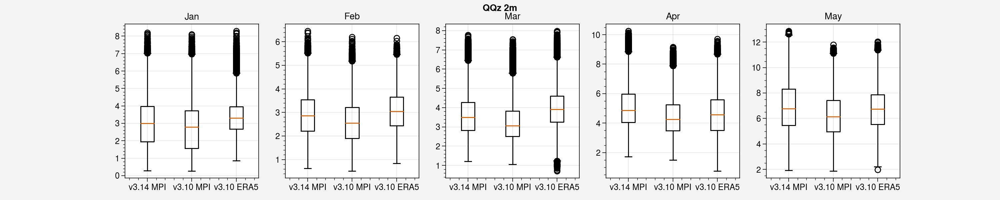

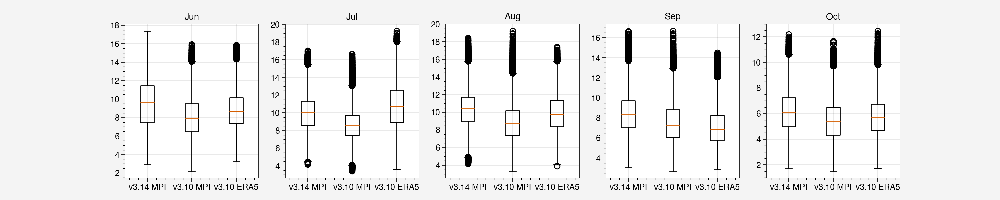

In [95]:
f,axs = plt.subplots(ncols=5)

months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct']
#flierprops = dict(marker='o', markerfacecolor='n', markersize=5)

for mon in range(5):
    axs[mon].boxplot([listmsk_EUn012015[mon][~listmsk_EUn012015[mon].mask],listmsk_EUy2015[mon][~listmsk_EUy2015[mon].mask],
                      listmsk_EUl2015[mon][~listmsk_EUl2015[mon].mask]],labels=['v3.14 MPI','v3.10 MPI','v3.10 ERA5'])
    axs[mon].set_title(months[mon])

f.set_figheight(3)
f.set_figwidth(15)
f.suptitle('QQz 2m')

f,axs = plt.subplots(ncols=5)

for mon in range(5):
    axs[mon].boxplot([listmsk_EUn012015[mon+5][~listmsk_EUn012015[mon+5].mask],listmsk_EUy2015[mon+5][~listmsk_EUy2015[mon+5].mask],
                      listmsk_EUl2015[mon+5][~listmsk_EUl2015[mon+5].mask]],labels=['v3.14 MPI','v3.10 MPI','v3.10 ERA5'])
    axs[mon].set_title(months[mon+5])

f.set_figheight(3)
f.set_figwidth(15)


## As a function of altitude

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "


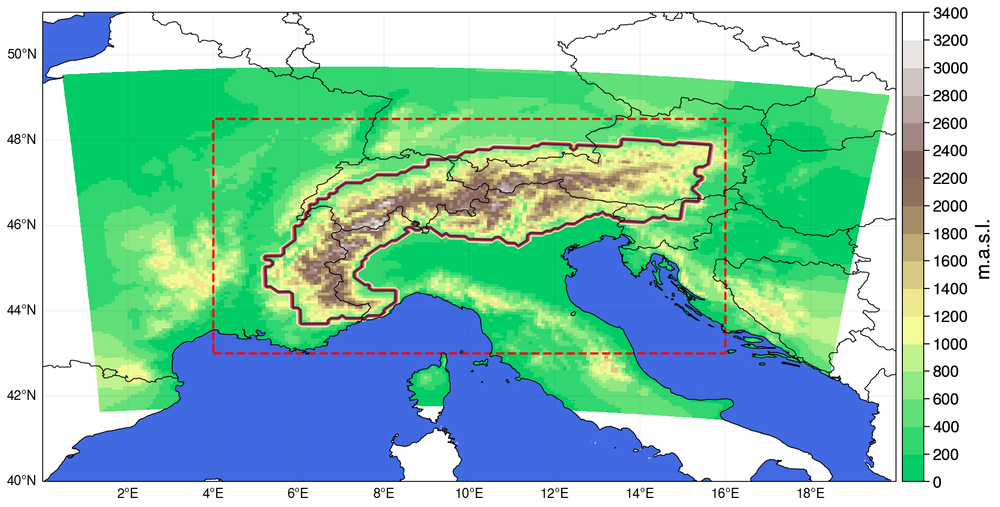

In [16]:
pplt.rc['figure.facecolor'] = 'white'

colors_land = plt.cm.terrain(np.linspace(0.25, 1, 256))
f, axs = pplt.subplots(proj='cyl', axwidth=8,ncols=1)

m=axs.pcolormesh(ds.LON, ds.LAT, ds.SH, levels=17,cmap=colors_land)
axs.colorbar(m,label= 'm.a.s.l.',labelsize='x-large',ticklabelsize='large')
axs.plot([4.,16.,16,4,4],[43.,43,48.5,48.5,43],'--r')
axs.contour(lon, lat, alps)

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[40.,51.],lonlim=[0.,20.])


In [11]:
# path = '/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/'
# ds_yrsv310 = xr.open_dataset(path + 'ds_Surfbal_vars_2015_2100_seas.npy')#.sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))

# ds_yrsv310

<xarray.Dataset>
Dimensions:  (Year: 86, season: 4, y: 126, x: 201, sector: 3, atmlay: 3,
              ztqlev: 4)
Coordinates:
  * x        (x) float32 -483.0 -476.0 -469.0 -462.0 ... 896.0 903.0 910.0 917.0
  * y        (y) float32 -308.0 -301.0 -294.0 -287.0 ... 546.0 553.0 560.0 567.0
  * ztqlev   (ztqlev) float32 2.0 10.0 50.0 100.0
  * sector   (sector) float32 1.0 2.0 3.0
  * atmlay   (atmlay) float32 0.9997 0.9995 0.999
  * season   (season) object 'DJF' 'MAM' 'JJA' 'SON'
  * Year     (Year) int64 2015 2016 2017 2018 2019 ... 2096 2097 2098 2099 2100
Data variables: (12/14)
    LWD      (Year, season, y, x) float64 ...
    LWU      (Year, season, y, x) float64 ...
    SWD      (Year, season, y, x) float64 ...
    SWU      (Year, season, y, x) float64 ...
    SHF      (Year, season, y, x) float64 ...
    LHF      (Year, season, y, x) float64 ...
    ...       ...
    TTmax    (Year, season, atmlay, y, x) float64 ...
    melt     (Year, season, y, x) float64 ...
    NSW      (Year, season, y, x) float64 ...
    NLW      (Year, season, y, x) float64 ...
    Surfbal  (Year, season, y, x) float64 ...
    TTz      (Year, season, ztqlev, y, x) float64 ...

In [13]:
path = '/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/'
ds314_MPI_SSP585 = xr.open_dataset(path + 'ds314_Surfbal_vars_2015_2100_seas.npy').isel(atmlay=0).sel(ztqlev=2.0)
#ds314_MPI_SSP585 = xr.open_dataset(path + 'ds314_Surfbal_vars_2015_2100_seas.npy').isel(y=slice(jmin,jmax),x=slice(imin,imax),atmlay=0).sel(ztqlev=2.0)

ds314_MPI_SSP585

<xarray.Dataset>
Dimensions:     (x: 139, y: 91, sector: 3, season: 4, Year: 86)
Coordinates:
  * x           (x) float32 -259.0 -252.0 -245.0 -238.0 ... 693.0 700.0 707.0
  * y           (y) float32 -168.0 -161.0 -154.0 -147.0 ... 448.0 455.0 462.0
  * sector      (sector) float32 1.0 2.0 3.0
  * season      (season) object 'DJF' 'MAM' 'JJA' 'SON'
  * Year        (Year) int64 2015 2016 2017 2018 2019 ... 2097 2098 2099 2100
    ztqlev      float32 2.0
    atmlay      float32 0.9997
Data variables: (12/25)
    LWD         (Year, season, y, x) float64 ...
    LWU         (Year, season, y, x) float64 ...
    SWD         (Year, season, y, x) float64 ...
    SWU         (Year, season, y, x) float64 ...
    SHF         (Year, season, y, x) float64 ...
    LHF         (Year, season, y, x) float64 ...
    ...          ...
    TTmax       (Year, season, y, x) float64 ...
    MBmTop      (Year, season, sector, y, x) float64 ...
    MBrTop      (Year, season, sector, y, x) float64 ...
    melt_top    (Year, season, y, x) float64 ...
    freeze_top  (Year, season, y, x) float64 ...
    ST          (Year, season, y, x) float64 ...

In [14]:
#ds314_MPI_SSP585 = ds314_MPI_SSP585.drop_vars(['SWU','SWD','LWU','LWD','MB','TTmax','TTmin'])
ds314_MPI_SSP585['Surfbal'] = ds314_MPI_SSP585['NSW'] + ds314_MPI_SSP585['NLW'] + ds314_MPI_SSP585['SHF'] + ds314_MPI_SSP585['LHF'] + ds314_MPI_SSP585['GF'] + \
                                ds314_MPI_SSP585['melt_top'] + ds314_MPI_SSP585['freeze_top'] + ds314_MPI_SSP585['HAcc'] + ds314_MPI_SSP585['SWt']
ds314_MPI_SSP585

<xarray.Dataset>
Dimensions:     (x: 139, y: 91, sector: 3, season: 4, Year: 86)
Coordinates:
  * x           (x) float32 -259.0 -252.0 -245.0 -238.0 ... 693.0 700.0 707.0
  * y           (y) float32 -168.0 -161.0 -154.0 -147.0 ... 448.0 455.0 462.0
  * sector      (sector) float32 1.0 2.0 3.0
  * season      (season) object 'DJF' 'MAM' 'JJA' 'SON'
  * Year        (Year) int64 2015 2016 2017 2018 2019 ... 2097 2098 2099 2100
    ztqlev      float32 2.0
    atmlay      float32 0.9997
Data variables: (12/26)
    LWD         (Year, season, y, x) float64 ...
    LWU         (Year, season, y, x) float64 ...
    SWD         (Year, season, y, x) float64 ...
    SWU         (Year, season, y, x) float64 ...
    SHF         (Year, season, y, x) float64 ...
    LHF         (Year, season, y, x) float64 ...
    ...          ...
    MBmTop      (Year, season, sector, y, x) float64 ...
    MBrTop      (Year, season, sector, y, x) float64 ...
    melt_top    (Year, season, y, x) float64 ...
    freeze_top  (Year, season, y, x) float64 ...
    ST          (Year, season, y, x) float64 ...
    Surfbal     (Year, season, y, x) float64 0.5079 0.5227 ... 0.1591 0.155

In [14]:
ds314_MPI_SSP585.atmlay

<xarray.DataArray 'atmlay' ()>
array(0.99974793, dtype=float32)
Coordinates:
    ztqlev   float32 2.0
    atmlay   float32 0.9997
Attributes:
    units:          sigma_level
    long_name:      atmlay
    standard_name:  atmlay

In [15]:
ds314_MPI_SSP585 = ds314_MPI_SSP585.where(ds314_MPI_SSP585 != -np.inf)


/tmp/ipykernel_2000250/270109896.py:15: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=14, large=12)
/tmp/ipykernel_2000250/270109896.py:15: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=14, large=12)
/tmp/ipykernel_2000250/270109896.py:63: ProplotWarning: rc setting 'small' was renamed to 'font.smallsize' in version 0.6.
  pplt.rc.update(small=14, large=12)
/tmp/ipykernel_2000250/270109896.py:63: ProplotWarning: rc setting 'large' was renamed to 'font.largesize' in version 0.6.
  pplt.rc.update(small=14, large=12)


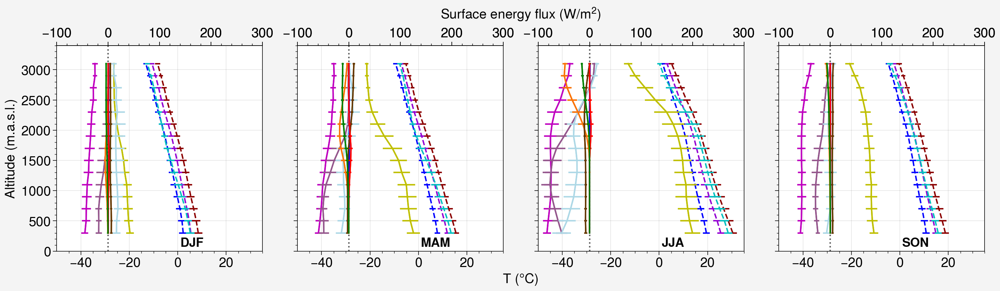

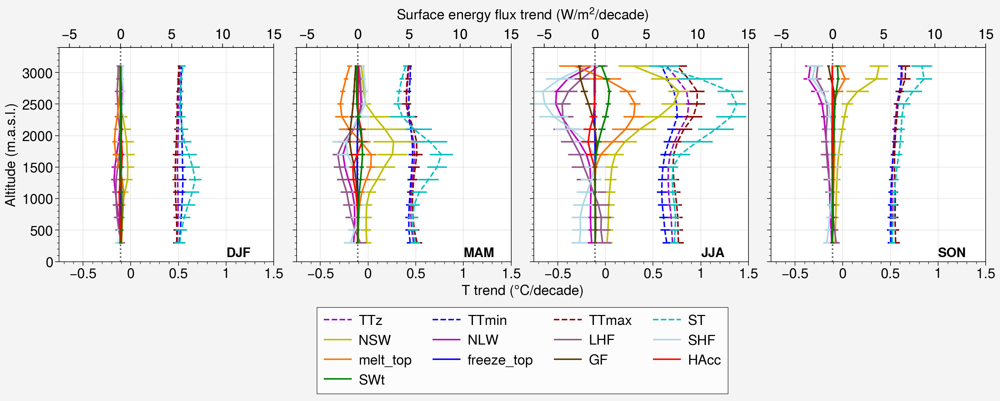

In [21]:
seasons=['DJF','MAM','JJA','SON']

# ------------------------ MARv3.14 7km simulation mean values ----------------------------

multiplier = 1 # =10 if trends per decade

colors = ['darkviolet','b','darkred','c','y','m','purple','lightblue','orange','blue','brown','r','green']#,'k']
leg_labels_null = ['','','','','','','','','','','','','','']
leg_labels_full = ['TTz','TTmin','TTmax','ST','NSW','NLW','LHF','SHF','melt_top','freeze_top','GF','HAcc','SWt']#,'Surfbal']
leg_labels = [leg_labels_full,leg_labels_null,leg_labels_null,leg_labels_null]

ds_slopes = ds314_MPI_SSP585.mean(dim='Year')
ds_slopes_Hlev, ds_slopes_Hlev_std = altitude_lev_slopes(ds_slopes,levels=levels)

pplt.rc.update(small=14, large=12)
with pplt.rc.context({'suptitle.weight': 'normal', 'suptitle.size': 14}):
    f, axs = pplt.subplots(ncols=4,axwidth=3.,axheight=3.)
axs2 = axs.twiny()

for seas in range(4):
    ax = axs[seas]
    ax2 = axs2[seas]
    for i,var in enumerate(leg_labels_full):
        if var=='TTz' or var=='TTmax' or var=='TTmin' or var=='ST':
            ax.plot(multiplier*ds_slopes_Hlev[var].isel(season=seas),H_levels,c=colors[i],linestyle='--',
                    label=leg_labels[seas][i])
        else:
            ax2.plot(multiplier*ds_slopes_Hlev[var].isel(season=seas),H_levels,c=colors[i],label=leg_labels[seas][i])
        for lev in range(len(levels)): # spatial standard deviation
            if var=='TTz' or var=='TTmax' or var=='TTmin' or var=='ST':
                slope_var = ds_slopes_Hlev[var].isel(season=seas)[lev]
                std_var = ds_slopes_Hlev_std[var].isel(season=seas)[lev]
                ax.plot([multiplier*(slope_var-std_var),multiplier*(slope_var+std_var)],[H_levels[lev],H_levels[lev]],c=colors[i])
            else:
                slope_var = ds_slopes_Hlev[var].isel(season=seas)[lev]
                std_var = ds_slopes_Hlev_std[var].isel(season=seas)[lev]
                ax2.plot([multiplier*(slope_var-std_var),multiplier*(slope_var+std_var)],[H_levels[lev],H_levels[lev]],c=colors[i])
    ax.set_xlim(-50,35)
    ax.text(1., 75, seasons[seas], fontsize=13,fontweight='semibold')
    ax.set_ylim(0,3400)
    ax2.vlines(0,0,3500,c='k',linestyle=':',alpha=0.4)
    ax2.set_xlim(-100,300)
    ax2.format(xlabel='')

#f.legend(loc='b',prop = { "size": 14 },ncols=4)
xLabel = 'T (°C)'
Suptitle='Surface energy flux (W/$m^2$)'

axs.format(xlabel=xLabel,ylabel='Altitude (m.a.s.l.)',suptitle=Suptitle)#,rowlabels=['MARv3.14 7km no lim'])

# ------------------------ MARv3.14 7km simulation trends ----------------------------

multiplier = 10 # =10 if trends per decade

colors = ['darkviolet','b','darkred','c','y','m','purple','lightblue','orange','blue','brown','r','green']#,'k']
leg_labels_null = ['','','','','','','','','','','','','','']
leg_labels_full = ['TTz','TTmin','TTmax','ST','NSW','NLW','LHF','SHF','melt_top','freeze_top','GF','HAcc','SWt']#,'Surfbal']
leg_labels = [leg_labels_full,leg_labels_null,leg_labels_null,leg_labels_null]

ds_slopes = ds314_MPI_SSP585.polyfit('Year', deg=1)
ds_slopes_Hlev, ds_slopes_Hlev_std = altitude_lev_slopes(ds_slopes,levels=levels)

pplt.rc.update(small=14, large=12)
with pplt.rc.context({'suptitle.weight': 'normal', 'suptitle.size': 14}):
    f, axs = pplt.subplots(ncols=4,axwidth=3.,axheight=3.)
axs2 = axs.twiny()

for seas in range(4):
    ax = axs[seas]
    ax2 = axs2[seas]
    for i,var in enumerate(leg_labels_full):
        if var=='TTz' or var=='TTmax' or var=='TTmin' or var=='ST':
            ax.plot(multiplier*ds_slopes_Hlev[var+'_polyfit_coefficients'].isel(season=seas,degree=0),H_levels,c=colors[i],linestyle='--',
                    label=leg_labels[seas][i])
        else:
            ax2.plot(multiplier*ds_slopes_Hlev[var+'_polyfit_coefficients'].isel(season=seas,degree=0),H_levels,c=colors[i],label=leg_labels[seas][i])
        for lev in range(len(levels)): # spatial standard deviation
            if var=='TTz' or var=='TTmax' or var=='TTmin' or var=='ST':
                slope_var = ds_slopes_Hlev[var+'_polyfit_coefficients'].isel(season=seas,degree=0)[lev]
                std_var = ds_slopes_Hlev_std[var+'_polyfit_coefficients'].isel(season=seas,degree=0)[lev]
                ax.plot([multiplier*(slope_var-std_var),multiplier*(slope_var+std_var)],[H_levels[lev],H_levels[lev]],c=colors[i])
            else:
                slope_var = ds_slopes_Hlev[var+'_polyfit_coefficients'].isel(season=seas,degree=0)[lev]
                std_var = ds_slopes_Hlev_std[var+'_polyfit_coefficients'].isel(season=seas,degree=0)[lev]
                ax2.plot([multiplier*(slope_var-std_var),multiplier*(slope_var+std_var)],[H_levels[lev],H_levels[lev]],c=colors[i])
    ax.set_xlim(-0.75,1.5)
    ax.text(1., 75, seasons[seas], fontsize=13,fontweight='semibold')
    ax.set_ylim(0,3400)
    ax2.vlines(0,0,3500,c='k',linestyle=':',alpha=0.4)
    ax2.set_xlim(-6,15)
    ax2.format(xlabel='')

f.legend(loc='b',prop = { "size": 14 },ncols=4)
xLabel = 'T trend (°C/decade)'
Suptitle='Surface energy flux trend (W/$m^2$/decade)'

axs.format(xlabel=xLabel,ylabel='Altitude (m.a.s.l.)',suptitle=Suptitle)#,rowlabels=['MARv3.14 7km no lim'])

### Testing EUn sim compared to obs and previous sims

#### Making datasets

In [21]:
ds_v310_ = make_ds_seas(path='/bettik/beaumetj/MARout/MAR-MPI-ESM1-2-HR/HIST/daily/ICE.MPI-ESM_HIST',simcode='y',vars=['TTz','MB','MBrr','MBsf'],
                                       first_year=1961,last_year=2014)

1962 Computing season mean 1963 Computing season mean 1964 Computing season mean 1965 Computing season mean 1966 Computing season mean 1967 Computing season mean 1968 Computing season mean 1969 Computing season mean 1970 Computing season mean 1971 Computing season mean 1972 Computing season mean 1973 Computing season mean 1974 Computing season mean 1975 Computing season mean 1976 Computing season mean 1977 Computing season mean 1978 Computing season mean 1979 Computing season mean 1980 Computing season mean 1981 Computing season mean 1982 Computing season mean 1983 Computing season mean 1984 Computing season mean 1985 Computing season mean 1986 Computing season mean 1987 Computing season mean 1988 Computing season mean 1989 Computing season mean 1990 Computing season mean 1991 Computing season mean 1992 Computing season mean 1993 Computing season mean 1994 Computing season mean 1995 Computing season mean 1996 Computing season mean 1997 Computing season mean 1998 Computing season mean 1

In [22]:
ds_v310_["precip"] = ds_v310_["MBrr"] + ds_v310_["MBsf"]

In [24]:
ds_v310_.to_netcdf('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/HIST/ds_TTz_MB_precip_1961_2015_seas.npy')

In [26]:
ds_v314_ = make_ds_seas(path='/bettik/castelli/data/MAR-MPI-ESM/v3.14/bigdomain/HIST/ICE.MPI-ESM_HIST',simcode='n',vars=['TTz','MB','MBrr','MBsf'],
                                       first_year=1961,last_year=2014)

1962 Computing season mean 1963 Computing season mean 1964 Computing season mean 1965 Computing season mean 1966 Computing season mean 1967 Computing season mean 1968 Computing season mean 1969 Computing season mean 1970 Computing season mean 1971 Computing season mean 1972 Computing season mean 1973 Computing season mean 1974 Computing season mean 1975 Computing season mean 1976 Computing season mean 1977 Computing season mean 1978 Computing season mean 1979 Computing season mean 1980 Computing season mean 1981 Computing season mean 1982 Computing season mean 1983 Computing season mean 1984 Computing season mean 1985 Computing season mean 1986 Computing season mean 1987 Computing season mean 1988 Computing season mean 1989 Computing season mean 1990 Computing season mean 1991 Computing season mean 1992 Computing season mean 1993 Computing season mean 1994 Computing season mean 1995 Computing season mean 1996 Computing season mean 1997 Computing season mean 1998 Computing season mean 1

In [27]:
ds_v314_["precip"] = ds_v314_["MBrr"] + ds_v314_["MBsf"]

In [28]:
ds_v314_.to_netcdf('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/HIST/ds314_TTz_MB_precip_1961_2015_seas.npy')

In [49]:
ds_v310_fut = make_ds_seas(path='/bettik/beaumetj/MARout/MAR-MPI-ESM1-2-HR/SSP585/daily/ICE.MPI-ESM_SSP585',simcode='y',vars=['TTz','MB','MBrr','MBsf'],
                                       first_year=2015,last_year=2100)

2016 Computing season mean 2017 Computing season mean 2018 Computing season mean 2019 Computing season mean 2020 Computing season mean 2021 Computing season mean 2022 Computing season mean 2023 Computing season mean 2024 Computing season mean 2025 Computing season mean 2026 Computing season mean 2027 Computing season mean 2028 Computing season mean 2029 Computing season mean 2030 Computing season mean 2031 Computing season mean 2032 Computing season mean 2033 Computing season mean 2034 Computing season mean 2035 Computing season mean 2036 Computing season mean 2037 Computing season mean 2038 Computing season mean 2039 Computing season mean 2040 Computing season mean 2041 Computing season mean 2042 Computing season mean 2043 Computing season mean 2044 Computing season mean 2045 Computing season mean 2046 Computing season mean 2047 Computing season mean 2048 Computing season mean 2049 Computing season mean 2050 Computing season mean 2051 Computing season mean 2052 Computing season mean 2

In [50]:
ds_v310_fut["precip"] = ds_v310_fut["MBrr"] + ds_v310_fut["MBsf"]

In [51]:
ds_v310_fut.to_netcdf('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/ds_TTz_MB_precip_2015_2100_seas.npy')

In [52]:
ds_v314_fut = make_ds_seas(path='/bettik/castelli/data/MAR-MPI-ESM/v3.14/bigdomain/SSP585/ICE.MPI-ESM_SSP585',simcode='n',vars=['TTz','MB','MBrr','MBsf'],
                                       first_year=2015,last_year=2100)

2016 Computing season mean 2017 Computing season mean 2018 Computing season mean 2019 Computing season mean 2020 Computing season mean 2021 Computing season mean 2022 Computing season mean 2023 Computing season mean 2024 Computing season mean 2025 Computing season mean 2026 Computing season mean 2027 Computing season mean 2028 Computing season mean 2029 Computing season mean 2030 Computing season mean 2031 Computing season mean 2032 Computing season mean 2033 Computing season mean 2034 Computing season mean 2035 Computing season mean 2036 Computing season mean 2037 Computing season mean 2038 Computing season mean 2039 Computing season mean 2040 Computing season mean 2041 Computing season mean 2042 Computing season mean 2043 Computing season mean 2044 Computing season mean 2045 Computing season mean 2046 Computing season mean 2047 Computing season mean 2048 Computing season mean 2049 Computing season mean 2050 Computing season mean 2051 Computing season mean 2052 Computing season mean 2

In [53]:
ds_v314_fut["precip"] = ds_v314_fut["MBrr"] + ds_v314_fut["MBsf"]

In [54]:
ds_v314_fut.to_netcdf('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/ds314_TTz_MB_precip_2015_2100_seas.npy')

### Comparison

In [14]:
ds_APGD = xr.open_dataset('/bettik/menegozm/EURO4M_APGD/06-coord_lonlat.nc')
ds_APGD = ds_APGD.rename_vars({'Longitude':'LON','Latitude':'LAT'})

In [15]:
ds_APGD_seas = season_mean(xr.open_dataset('/bettik/castelli/data/EURO4M_APGD/APGD_1971.nc').PRECIPITATION).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],
                                                                                                                                dims=['season']))

for year in range(1972,2009):
    print(year,end = ' ')
    ds_yr = season_mean(xr.open_dataset('/bettik/castelli/data/EURO4M_APGD/APGD_'+str(year)+'.nc').PRECIPITATION).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],
                                                                                                                                dims=['season']))
    ds_APGD_seas = xr.concat([ds_APGD_seas,ds_yr], dim='Year')

1972 1973 1974 1975 1976 1977 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008 

In [ ]:
yrs = np.arange(1971,2009)
ds_APGD_seas = ds_APGD_seas.assign_coords(Year=("Year", yrs))

In [ ]:
ds_TG_EOBS = xr.open_dataset('/bettik/castelli/data/E-OBS/tg_ens_mean_0.1deg_reg_v29.0e.nc').tg.isel(latitude=np.arange(170,250,1),longitude=np.arange(280,430,1))
ds_TG_EOBS

In [ ]:
ds_TG_EOBS_seas = season_mean(ds_TG_EOBS.sel(time='1950')).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))


for year in range(1951,2024):
    print(year,end = ' ')
    ds_seas = season_mean(ds_TG_EOBS.sel(time=str(year))).sortby(xr.DataArray(['DJF','MAM','JJA', 'SON'],dims=['season']))

    ds_TG_EOBS_seas = xr.concat([ds_TG_EOBS_seas,ds_seas], dim='Year')

yrs = np.arange(1950,2024)
ds_TG_EOBS_seas = ds_TG_EOBS_seas.assign_coords(Year=("Year", yrs))

In [16]:
ds_v310_ = xr.open_dataset('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/HIST/ds_TTz_MB_precip_1961_2015_seas.npy')

In [17]:
ds_v314_ = xr.open_dataset('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/HIST/ds314_TTz_MB_precip_1961_2015_seas.npy')

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

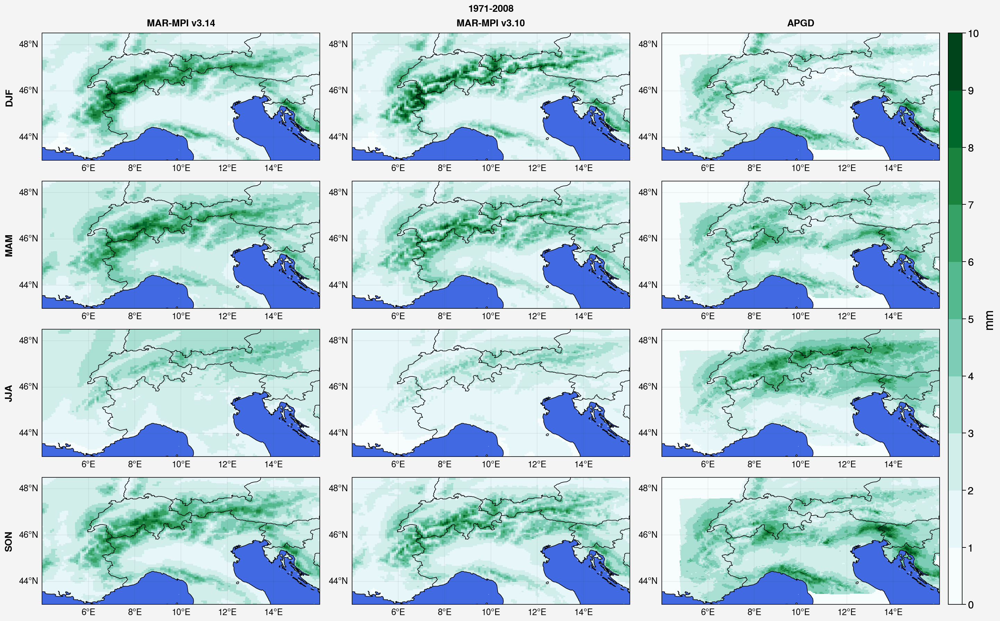

In [33]:
f, axs = pplt.subplots(proj='cyl', axwidth=4,ncols=3,nrows=4)

yr_start = 1971
yr_end = 2008

colmap = 'BuGn'

for seas in range(4):
    m=axs[3*seas].pcolormesh(ds.LON, ds.LAT, ds_v314_.precip.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).mean(dim='Year'),
                           levels=np.arange(0,11,1),cmap=colmap)

    m=axs[1+3*seas].pcolormesh(ds.LON, ds.LAT, ds_v310_.precip.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).mean(dim='Year'),
                             levels=np.arange(0,11,1),cmap=colmap)

    m=axs[2+3*seas].pcolormesh(ds_APGD.LON, ds_APGD.LAT, ds_APGD_seas.isel(season=seas).mean(dim='Year'), levels=np.arange(0,11,1),cmap=colmap)

f.colorbar(m,label= 'mm',labelsize='x-large',ticklabelsize='large')

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],rowlabels=['DJF','MAM','JJA','SON'],
         collabels=['MAR-MPI v3.14','MAR-MPI v3.10','APGD'],suptitle='1971-2008')



/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

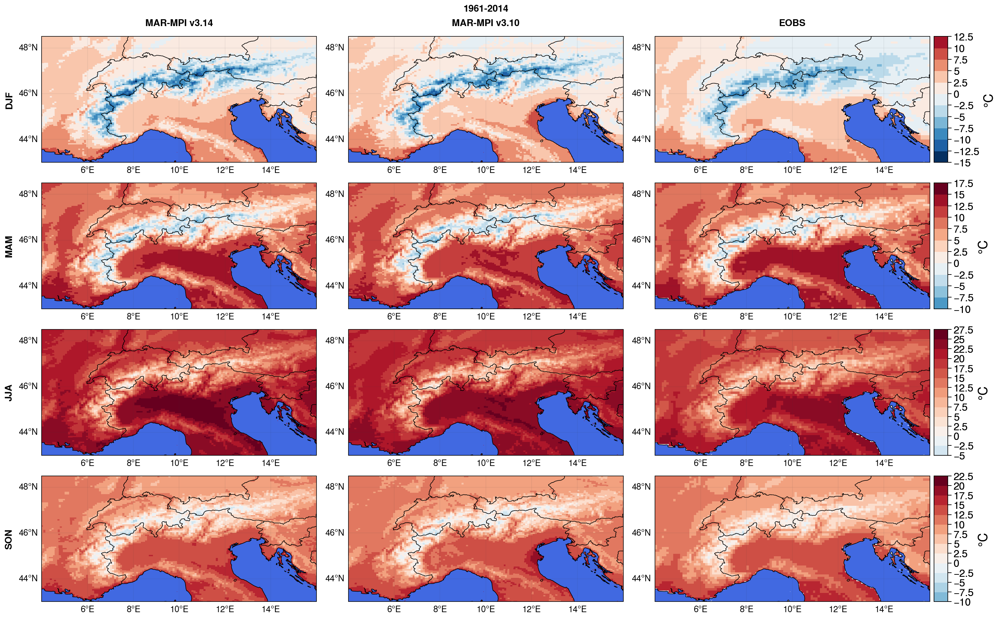

In [48]:
f, axs = pplt.subplots(proj='cyl', axwidth=4,ncols=3,nrows=4)

yr_start = 1961
yr_end = 2014

colmap = 'RdBu_r'
levels_seas = [np.arange(-15,15,2.5),np.arange(-10,20,2.5),np.arange(-5,30,2.5),np.arange(-10,25,2.5)]

for seas in range(4):
    m=axs[3*seas].pcolormesh(ds.LON, ds.LAT, ds_v314_.TTz.isel(season=seas).sel(ztqlev=2.0,Year=slice(str(yr_start),str(yr_end))).mean(dim='Year'),
                           levels=levels_seas[seas],cmap=colmap)

    m=axs[3*seas+1].pcolormesh(ds.LON, ds.LAT, ds_v310_.TTz.isel(season=seas).sel(ztqlev=2.0,Year=slice(str(yr_start),str(yr_end))).mean(dim='Year'),
                             levels=levels_seas[seas],cmap=colmap)

    m=axs[3*seas+2].pcolormesh(ds_TG_EOBS_seas.longitude, ds_TG_EOBS_seas.latitude,
                               ds_TG_EOBS_seas.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).mean(dim='Year'),
                             levels=levels_seas[seas],cmap=colmap)

    axs[3*seas+2].colorbar(m,label= '°C',labelsize='x-large',ticklabelsize='large')

#f.colorbar(m,label= 'mm',labelsize='x-large',ticklabelsize='large')

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],rowlabels=['DJF','MAM','JJA','SON'],
         collabels=['MAR-MPI v3.14','MAR-MPI v3.10','EOBS'],suptitle='1961-2014')


In [55]:
ds_v314_

<xarray.Dataset>
Dimensions:  (x: 201, y: 126, ztqlev: 3, sector: 3, Year: 54, season: 4)
Coordinates:
  * x        (x) float32 -483.0 -476.0 -469.0 -462.0 ... 896.0 903.0 910.0 917.0
  * y        (y) float32 -308.0 -301.0 -294.0 -287.0 ... 546.0 553.0 560.0 567.0
  * ztqlev   (ztqlev) float32 2.0 10.0 100.0
  * sector   (sector) float32 1.0 2.0 3.0
  * season   (season) object 'DJF' 'MAM' 'JJA' 'SON'
  * Year     (Year) int64 1961 1962 1963 1964 1965 ... 2010 2011 2012 2013 2014
Data variables:
    TTz      (Year, season, ztqlev, y, x) float64 5.24 5.343 ... 6.82 6.806
    MB       (Year, season, sector, y, x) float64 0.0 0.0 0.0 ... 0.0 0.0 0.0
    MBrr     (Year, season, y, x) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    MBsf     (Year, season, y, x) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    precip   (Year, season, y, x) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0

In [25]:
ds_v310_ = ds_v310_.assign_coords(x=ds_v314_.x)
ds_v310_ = ds_v310_.assign_coords(y=ds_v314_.y)


/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

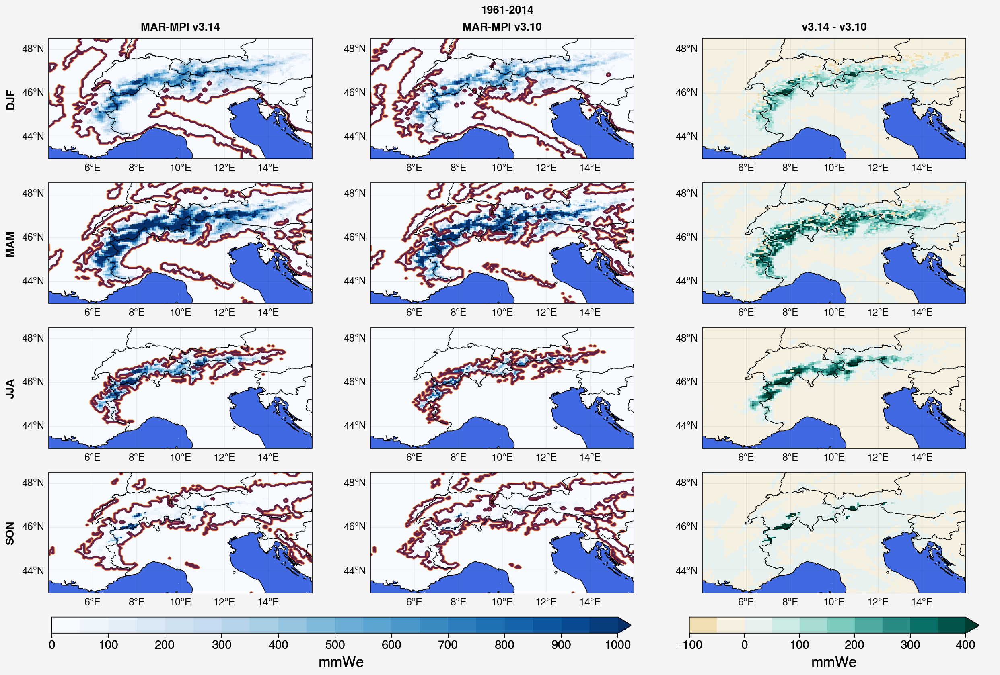

In [33]:
f, axs = pplt.subplots(proj='cyl', axwidth=4,axheight=1.5,ncols=3,nrows=4)

yr_start = 1961
yr_end = 2014

colmap = 'Blues'
colmap2 = 'BrBG'
#levels_seas = [np.arange(-15,15,2.5),np.arange(-10,20,2.5),np.arange(-5,30,2.5),np.arange(-10,25,2.5)]
levels_seas = np.arange(0,1050,50.)
levels_seas2 = np.arange(-100,450,50)

for seas in range(4):
    snow_314 = ds_v314_.MB.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).max(dim='sector').mean(dim='Year')
    m=axs[3*seas].pcolormesh(ds.LON, ds.LAT, snow_314,levels=levels_seas,cmap=colmap,extend='max')
    axs[3*seas].contour(ds.LON, ds.LAT,(snow_314 > 1))

    snow_310 = ds_v310_.MB.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).max(dim='sector').mean(dim='Year')
    m=axs[3*seas+1].pcolormesh(ds.LON, ds.LAT, snow_310, levels=levels_seas,cmap=colmap,extend='max')
    axs[3*seas+1].contour(ds.LON, ds.LAT,(snow_310 > 1))
    
    m2=axs[3*seas+2].pcolormesh(ds.LON, ds.LAT, snow_314 - snow_310, levels=levels_seas2,cmap=colmap2,extend='max')


f.colorbar(m,label= 'mmWe',labelsize='x-large',ticklabelsize='large',loc='b',cols=(1,2),length=0.9)
f.colorbar(m2,label= 'mmWe',labelsize='x-large',ticklabelsize='large',loc='b',col=3,length=0.9)

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],rowlabels=['DJF','MAM','JJA','SON'],
         collabels=['MAR-MPI v3.14','MAR-MPI v3.10','v3.14 - v3.10'],suptitle='1961-2014')


In [57]:
ds_v314_.MB.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).max(dim='sector').mean(dim='Year')

<xarray.DataArray 'MB' (y: 126, x: 201)>
array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 5.33029074e-04, 8.15785076e-04, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 4.05627452e-04, 6.04500374e-04, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 6.76737290e-02, 8.94873043e-02, ...,
        4.54462212e+00, 4.65595828e+00, 0.00000000e+00],
       [0.00000000e+00, 7.33943203e-02, 8.03949174e-02, ...,
        4.28741137e+00, 4.79562638e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])
Coordinates:
  * x        (x) float32 -483.0 -476.0 -469.0 -462.0 ... 896.0 903.0 910.0 917.0
  * y        (y) float32 -308.0 -301.0 -294.0 -287.0 ... 546.0 553.0 560.0 567.0
    season   <U3 'DJF'

In [34]:
ds_v310_fut = xr.open_dataset('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/ds_TTz_MB_precip_2015_2100_seas.npy')

In [35]:
ds_v314_fut = xr.open_dataset('/bettik/castelli/data/saved_data_MAR_MPI_ESM1_2_HR/SSP585/ds314_TTz_MB_precip_2015_2100_seas.npy')

In [40]:
ds_v310_fut = ds_v310_fut.assign_coords(x=ds_v314_fut.x)
ds_v310_fut = ds_v310_fut.assign_coords(y=ds_v314_fut.y)

In [38]:
ds_v314_fut.TTz.isel(season=seas).sel(ztqlev=2.0,Year=slice(str(yr_start),str(yr_end))).mean(dim='Year')

<xarray.DataArray 'TTz' (y: 126, x: 201)>
array([[16.58367819, 16.64981826, 16.75318493, ..., 22.91368071,
        22.84138137, 22.77077217],
       [16.4263791 , 16.54025543, 16.51640222, ..., 22.23858344,
        22.24987006, 22.75506431],
       [16.18689586, 16.21176448, 16.06192913, ..., 22.23040614,
        22.21488139, 22.73877009],
       ...,
       [13.99982219, 13.93213673, 13.91072941, ..., 10.58491494,
        10.6935602 , 10.55866314],
       [14.01916125, 13.93014309, 13.98335205, ..., 10.6493792 ,
        10.65398609, 10.43554984],
       [14.02495748, 14.01711841, 14.00630165, ..., 10.3555776 ,
        10.35570651, 10.35135153]])
Coordinates:
  * x        (x) float32 -483.0 -476.0 -469.0 -462.0 ... 896.0 903.0 910.0 917.0
  * y        (y) float32 -308.0 -301.0 -294.0 -287.0 ... 546.0 553.0 560.0 567.0
    ztqlev   float32 2.0
    season   <U3 'SON'

/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

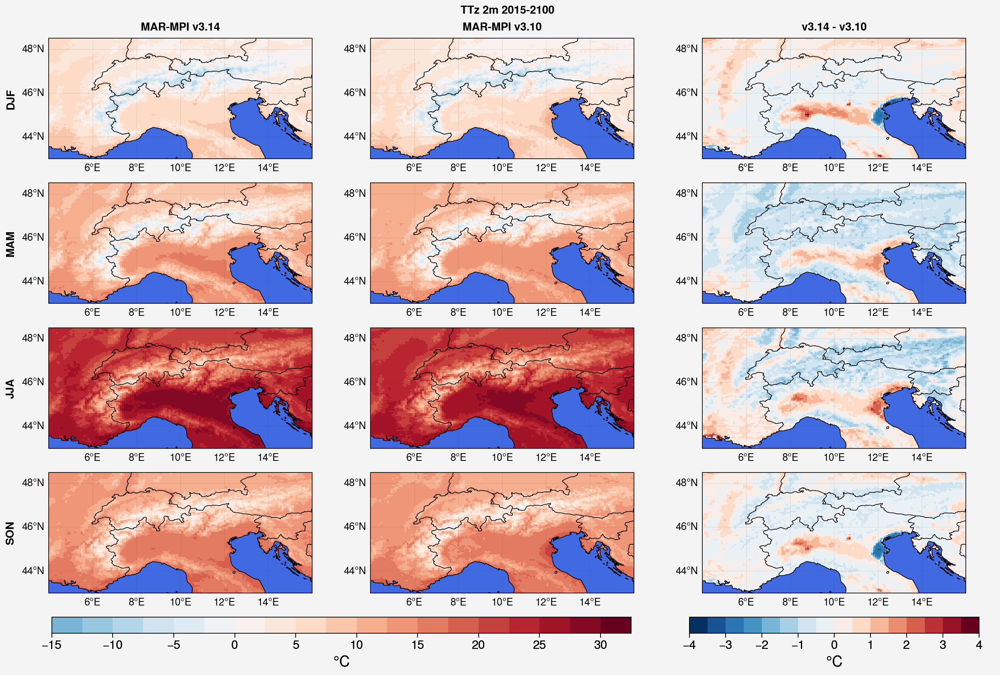

In [42]:
f, axs = pplt.subplots(proj='cyl', axwidth=4,axheight=1.5,ncols=3,nrows=4)

yr_start = 2015
yr_end = 2100

colmap = 'RdBu_r'
#levels_seas = [np.arange(-15,15,2.5),np.arange(-10,20,2.5),np.arange(-5,35,2.5),np.arange(-10,25,2.5)]
levels_seas = np.arange(-15,35,2.5)
levels_seas2 = np.arange(-4,4.5,0.5)

for seas in range(4):
    T_314 = ds_v314_fut.TTz.isel(season=seas).sel(ztqlev=2.0,Year=slice(str(yr_start),str(yr_end))).mean(dim='Year')
    m=axs[3*seas].pcolormesh(ds.LON, ds.LAT, T_314, levels=levels_seas,cmap=colmap)

    T_310 = ds_v310_fut.TTz.isel(season=seas).sel(ztqlev=2.0,Year=slice(str(yr_start),str(yr_end))).mean(dim='Year')
    m=axs[3*seas+1].pcolormesh(ds.LON, ds.LAT, T_310, levels=levels_seas,cmap=colmap)

    m2=axs[3*seas+2].pcolormesh(ds.LON, ds.LAT, T_314 - T_310, levels=levels_seas2,cmap=colmap)

f.colorbar(m,label= '°C',labelsize='x-large',ticklabelsize='large',loc='b',cols=(1,2),length=0.9)
f.colorbar(m2,label= '°C',labelsize='x-large',ticklabelsize='large',loc='b',col=3,length=0.9)

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],rowlabels=['DJF','MAM','JJA','SON'],
         collabels=['MAR-MPI v3.14','MAR-MPI v3.10','v3.14 - v3.10'],suptitle='TTz 2m 2015-2100')


/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

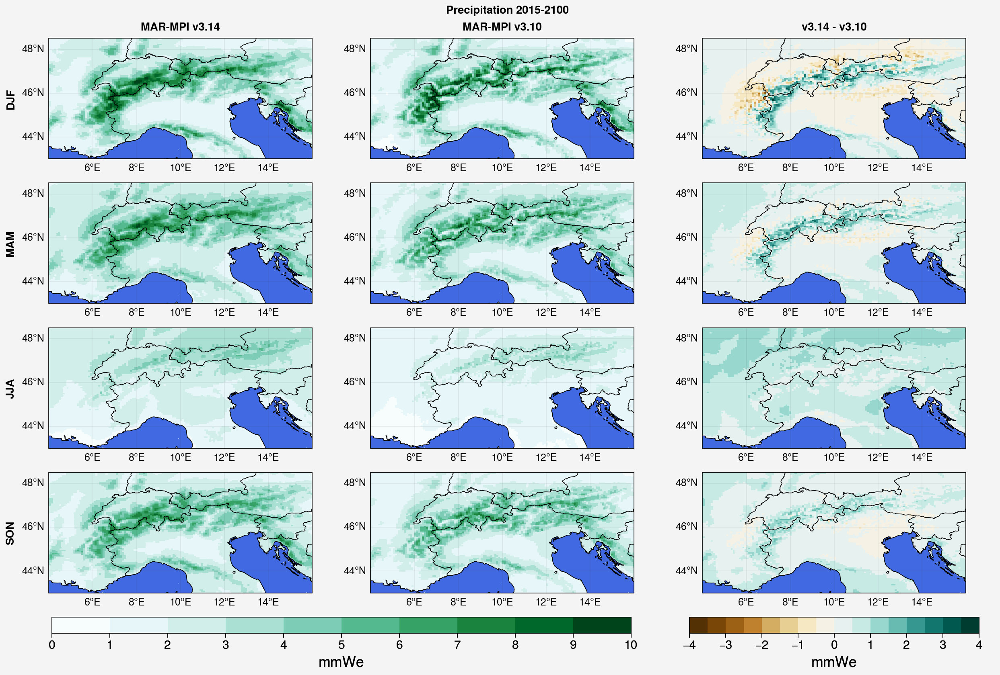

In [44]:
f, axs = pplt.subplots(proj='cyl', axwidth=4,axheight=1.5,ncols=3,nrows=4)

yr_start = 2015
yr_end = 2100

colmap = 'BuGn'
colmap2 = 'BrBG'
#levels_seas = [np.arange(-15,15,2.5),np.arange(-10,20,2.5),np.arange(-5,35,2.5),np.arange(-10,25,2.5)]
levels_seas = np.arange(0,11,1.)
levels_seas2 = np.arange(-4,4.5,0.5)

for seas in range(4):
    precip_314 = ds_v314_fut.precip.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).mean(dim='Year')
    m=axs[3*seas].pcolormesh(ds.LON, ds.LAT, precip_314, levels=levels_seas,cmap=colmap)

    precip_310 = ds_v310_fut.precip.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).mean(dim='Year')
    m=axs[3*seas+1].pcolormesh(ds.LON, ds.LAT, precip_310, levels=levels_seas,cmap=colmap)

    m2=axs[3*seas+2].pcolormesh(ds.LON, ds.LAT, precip_314 - precip_310, levels=levels_seas2,cmap=colmap2)

f.colorbar(m,label= 'mmWe',labelsize='x-large',ticklabelsize='large',loc='b',cols=(1,2),length=0.9)
f.colorbar(m2,label= 'mmWe',labelsize='x-large',ticklabelsize='large',loc='b',col=3,length=0.9)

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],rowlabels=['DJF','MAM','JJA','SON'],
         collabels=['MAR-MPI v3.14','MAR-MPI v3.10','v3.14 - v3.10'],suptitle='Precipitation 2015-2100')


/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

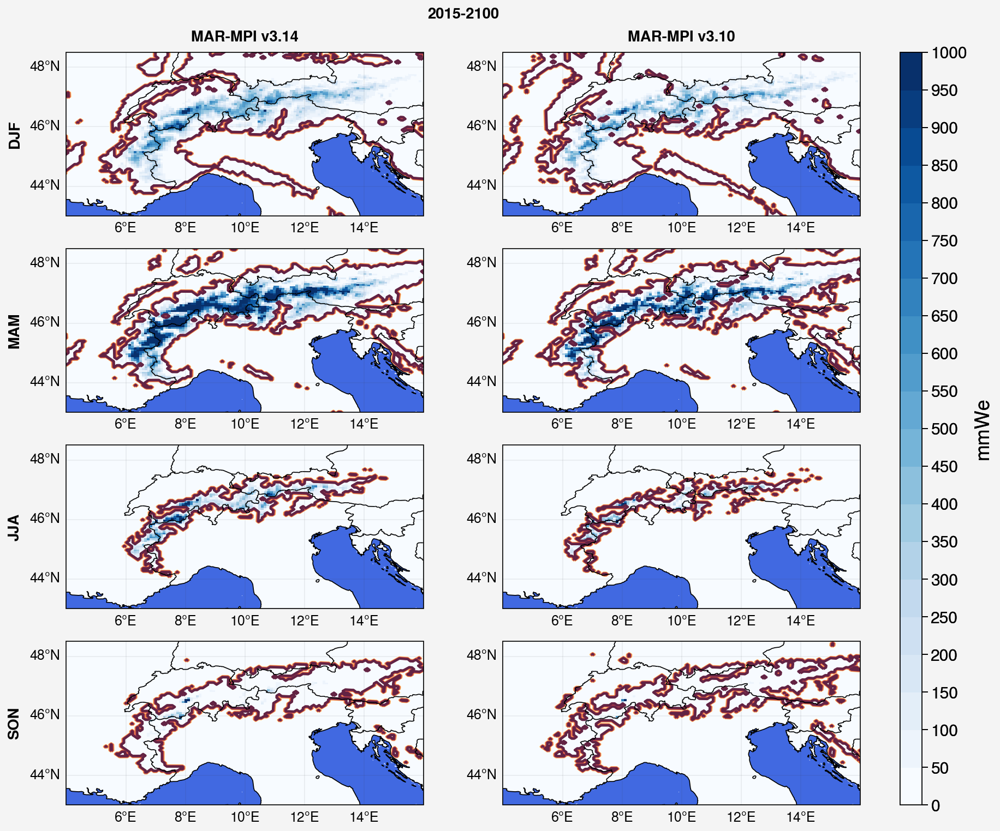

In [18]:
f, axs = pplt.subplots(proj='cyl', axwidth=4,axheight=1.5,ncols=2,nrows=4)

yr_start = 2015
yr_end = 2100

colmap = 'Blues'
#levels_seas = [np.arange(-15,15,2.5),np.arange(-10,20,2.5),np.arange(-5,30,2.5),np.arange(-10,25,2.5)]
levels_seas = np.arange(0,1050,50.)

for seas in range(4):
    m=axs[2*seas].pcolormesh(ds.LON, ds.LAT, ds_v314_fut.MB.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).max(dim='sector').mean(dim='Year'),
                           levels=levels_seas,cmap=colmap)
    axs[2*seas].contour(ds.LON, ds.LAT,(ds_v314_fut.MB.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).max(dim='sector').mean(dim='Year') > 1))

    m=axs[2*seas+1].pcolormesh(ds.LON, ds.LAT, ds_v310_fut.MB.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).max(dim='sector').mean(dim='Year'),
                             levels=levels_seas,cmap=colmap)
    axs[2*seas+1].contour(ds.LON, ds.LAT,(ds_v310_fut.MB.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).max(dim='sector').mean(dim='Year') > 1))



f.colorbar(m,label= 'mmWe',labelsize='x-large',ticklabelsize='large')

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],rowlabels=['DJF','MAM','JJA','SON'],
         collabels=['MAR-MPI v3.14','MAR-MPI v3.10'],suptitle='2015-2100')


/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAxes instead.
  warnings.warn("The `map_projection` keyword argument is "
/home/castelli/.conda/envs/phd_v3/lib/python3.10/site-packages/cartopy/mpl/geoaxes.py:403: UserWarning: The `map_projection` keyword argument is deprecated, use `projection` to instantiate a GeoAx

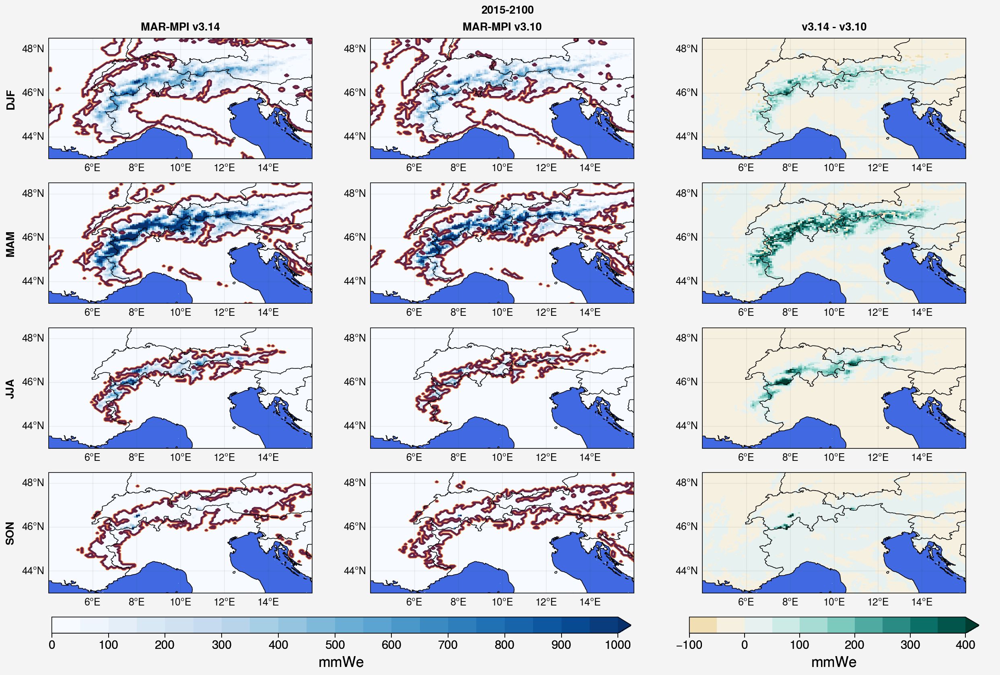

In [45]:
f, axs = pplt.subplots(proj='cyl', axwidth=4,axheight=1.5,ncols=3,nrows=4)

yr_start = 2015
yr_end = 2100

colmap = 'Blues'
colmap2 = 'BrBG'
#levels_seas = [np.arange(-15,15,2.5),np.arange(-10,20,2.5),np.arange(-5,30,2.5),np.arange(-10,25,2.5)]
levels_seas = np.arange(0,1050,50.)
levels_seas2 = np.arange(-100,450,50)

for seas in range(4):
    snow_314 = ds_v314_fut.MB.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).max(dim='sector').mean(dim='Year')
    m=axs[3*seas].pcolormesh(ds.LON, ds.LAT, snow_314,levels=levels_seas,cmap=colmap,extend='max')
    axs[3*seas].contour(ds.LON, ds.LAT,(snow_314 > 1))

    snow_310 = ds_v310_fut.MB.isel(season=seas).sel(Year=slice(str(yr_start),str(yr_end))).max(dim='sector').mean(dim='Year')
    m=axs[3*seas+1].pcolormesh(ds.LON, ds.LAT, snow_310, levels=levels_seas,cmap=colmap,extend='max')
    axs[3*seas+1].contour(ds.LON, ds.LAT,(snow_310 > 1))
    
    m2=axs[3*seas+2].pcolormesh(ds.LON, ds.LAT, snow_314 - snow_310, levels=levels_seas2,cmap=colmap2,extend='max')


f.colorbar(m,label= 'mmWe',labelsize='x-large',ticklabelsize='large',loc='b',cols=(1,2),length=0.9)
f.colorbar(m2,label= 'mmWe',labelsize='x-large',ticklabelsize='large',loc='b',col=3,length=0.9)

f.format(**normal_format)
f.format(ocean=True,oceancolor='royalblue',reso='hi', latlim=[43.,48.5],lonlim=[4.,16.],rowlabels=['DJF','MAM','JJA','SON'],
         collabels=['MAR-MPI v3.14','MAR-MPI v3.10','v3.14 - v3.10'],suptitle='2015-2100')
